In [1]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from diffusion_utilities import *

# Setting Things Up

In [2]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=32):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True) # 3x3, padding 1. applies 2 times. outputs 256 channels

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[batch, 256, 16, 16]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[batch, 256, 8,  8]
        self.down3 = UnetDown(2 * n_feat, 2 * n_feat)    # down3 #[bacth, 256, 4,  4]


         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 2*n_feat)
        self.timeembed3 = EmbedFC(1, n_feat)
        #self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        #self.contextembed2 = EmbedFC(n_cfeat, 2*n_feat)
        #self.contextembed3 = EmbedFC(n_cfeat, n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//8, self.h//8), # up-sample
            nn.GroupNorm(8, 2 * n_feat), # normalize
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, 2 * n_feat)
        self.up2 = UnetUp(4 * n_feat, n_feat)
        self.up3 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on
        #print(f"Input shape: {x.shape}")
        #we begin 3x32x32
        x = self.init_conv(x) # feat x 32 x 32
        #print(f"After init_conv shape: {x.shape}")
        down1 = self.down1(x) # feat x 16 x 16
        #print(f"After down1 shape: {down1.shape}")
        down2 = self.down2(down1) # 2feat x 8 x 8
        #print(f"After down2 shape: {down2.shape}")
        down3 = self.down3(down2) # 2feat x 4 x 4
        #print(f"After down3 shape: {down3.shape}")

        hiddenvec = self.to_vec(down3) #IT IS NOT A VECTOR, WE HAVE 2FEAT X 4 X 4
        #print(f"Hidden vector shape: {hiddenvec.shape}")

        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x) # (batch, cfeat)

        # embed context and timestep
        #cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        #cemb2 = self.contextembed2(c).view(-1, self.n_feat * 2, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat * 2, 1, 1)
        #cemb3 = self.contextembed3(c).view(-1, self.n_feat , 1, 1)
        temb3 = self.timeembed3(t).view(-1, self.n_feat , 1, 1)


        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        # up1 = self.up0(hiddenvec)
        # up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        # up3 = self.up2(cemb2*up2 + temb2, down1)
        # print(f"Shape of up3 before final concat: {up3.shape}")
        # print(f"Shape of x before final concat: {x.shape}")
        # # Ensure up3 and x have the same height and width before concatenation
        # if up3.shape[2:] != x.shape[2:]:
        #     up3 = nn.functional.interpolate(up3, size=x.shape[2:], mode='nearest')
        up1 = self.up0(hiddenvec)
        #print(f"After up0 shape: {up1.shape}")

        up2 = self.up1(up1 + temb1, down3)
        #print(f"After up1 shape: {up2.shape}")

        up3 = self.up2(up2 + temb2, down2)
        #print(f"After up2 shape: {up3.shape}")

        up4 = self.up3(up3 + temb3, down1)
        #print(f"After up3 shape: {up4.shape}")


        out = self.out(torch.cat((up4, x), 1))
        return out


In [3]:
# hyperparameters

# diffusion hyperparameters
timesteps = 1000
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
#device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
device = torch.device("mps" if torch.backends.mps.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 10 # context vector is of size 10
height = 32 # 16x16 image
save_dir = './weights/'
chan = 3

# training hyperparameters
batch_size = 128
n_epoch = 32
lrate=1e-3

In [4]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

In [5]:
# construct model
nn_model = ContextUnet(in_channels=chan, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

In [6]:
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 5)
        self.fc1 = nn.Linear(64 * 5 * 5, 80)
        self.fc2 = nn.Linear(80, 40)
        self.fc3 = nn.Linear(40, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

In [7]:
# helper function; removes the predicted noise (but adds some noise back in to avoid collapse)
@torch.no_grad()
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [8]:
save_rate=20

In [9]:
# sample using standard algorithm
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, chan, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    intermediate.append(samples.detach().cpu().numpy())
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate ==0 or i==timesteps:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [61]:
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

In [62]:
net.load_state_dict(torch.load("./reco/adam_100_1,7.pth"))

<All keys matched successfully>

In [63]:
nn_model.load_state_dict(torch.load("./weights/MNIST_3999.pth", map_location = torch.device(device)) )
nn_model.eval() 
print("hi")

hi


In [64]:
samples, _ = sample_ddpm(16)

In [65]:
samples = samples.cpu()

In [70]:
plt.clf()
animation_ddpm = plot_sample(_,16,2,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [66]:
torch.max(net(samples), 1)

torch.return_types.max(
values=tensor([ 9.0846, 10.3079, 12.8821,  2.8457, 20.7142,  7.5691, 14.0788, 11.2242,
         4.9840, 16.5263, 13.9708, 11.9329,  9.0978, 12.7605, 21.7136, 10.9341],
       grad_fn=<MaxBackward0>),
indices=tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0]))

In [67]:
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 5)
        self.fc1 = nn.Linear(64 * 5 * 5, 80)
        self.fc2 = nn.Linear(80, 40)
        self.fc3 = nn.Linear(40, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

In [68]:
net.load_state_dict(torch.load("./reco/adam_100_world_ender_1.pth"))

<All keys matched successfully>

In [69]:
torch.max(net(samples), 1)

torch.return_types.max(
values=tensor([ 1.9213,  3.9519,  0.0906,  4.5879,  9.0420,  3.0687,  1.2691,  8.5313,
        -0.9053,  3.1140, -0.3284,  3.4027,  3.7371,  5.6857,  7.1120,  5.5045],
       grad_fn=<MaxBackward0>),
indices=tensor([1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]))

In [15]:
timesteps = 1000

In [16]:
save_rate = 20

# Speciation

In [25]:
torch.device(device)

device(type='mps')

In [30]:
@torch.no_grad()
def go_in(timesteps):
    fi=dict()
    for x in range(0,timesteps+1,20):
        fi[x]=0
    
    for o in range (1):
        samples, intermediate = sample_ddpm(25)
        samples = samples.cpu()
        _, samples_class = torch.max(net(samples), 1)

        for step in range(timesteps,-1,-20):
            clones = torch.Tensor(intermediate [int(timesteps/save_rate) - int(step/save_rate)]).to(device)
            if step % 100 == 0:
                print(step, "-->", end=" ")

            for i in range(step, 0, -1):
                # reshape time tensor
                t = torch.tensor([i / timesteps])[:, None, None, None].to(device)
                # sample some random noise to inject back in. For i = 1, don't add back in noise
                z = torch.randn_like(clones) if i > 1 else 0
                eps = nn_model(clones, t)    # predict noise e_(x_t,t)
                clones = denoise_add_noise(clones, i, eps, z)
            # Now look at the resulting classes
            clones = clones.cpu()
            _, clone_class = torch.max(net(clones), 1)
            clones = clones.to(device)
            
        
            fi[step] += int(sum(clone_class == samples_class)) 
        print("\n")
    for x in fi:
        fi[x] /= 100

    return fi

            # Check if resulting class is the same as sample[x]
            # If yes (or no), update average 



In [31]:
a = go_in(timesteps)

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 



In [32]:
N = 1

#Prendine uno ogni N
mask = []
for i in range(len(a)):
    if i%N == 0:
        mask.append(True)
    else:
        mask.append(False)


/var/folders/cd/sr6rtt2j1rqdn0jdyblt3ztm0000gn/T/ipykernel_73193/3599024174.py:13: RuntimeWarning: overflow encountered in exp
  return L / (1 + np.exp(-k*(x-x0))) #+ 0.5


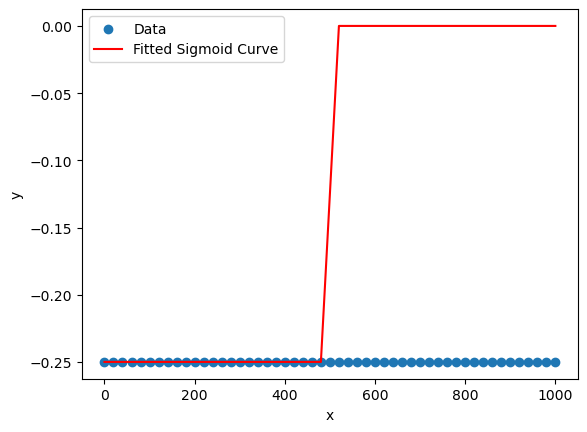

In [33]:
import numpy as np
from scipy.optimize import curve_fit
from scipy.special import expit  # Logistic function
import matplotlib.pyplot as plt
# Generate example data
new = np.array(list(a.keys()))[mask]
np.random.seed(0)
x_data = np.linspace(0, 1000, len(new))
y_data = np.array([a[x] for x in new]) -0.5

# Define the sigmoidal function using scipy's expit (logistic) function
def sigmoid(x, L, x0, k):
    return L / (1 + np.exp(-k*(x-x0))) #+ 0.5


# Fit the sigmoidal function to the data
popt, pcov = curve_fit(sigmoid, x_data, y_data, p0=[max(y_data), np.median(x_data),-1])

# Plot the original data
plt.scatter(x_data, y_data, label='Data')

# Plot the fitted sigmoid curve
x_fit = np.linspace(0, 1000, 1000)
plt.plot(x_data, sigmoid(x_data, *popt), 'r-', label='Fitted Sigmoid Curve')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()


In [26]:
import json

# Save dictionary to a JSON file
with open('double_clone_aaa.json', 'w') as json_file:
    json.dump(a, json_file)


In [2]:
import json
# Load dictionary from the JSON file
with open('spec_ciphar_0.json', 'r') as json_file:
    b = json.load(json_file)

a = dict()
for x in b:
    a[int(x)] = b[x]

print(a)

{0: 0.93, 20: 0.97, 40: 0.95, 60: 0.97, 80: 0.93, 100: 0.95, 120: 0.95, 140: 0.93, 160: 0.88, 180: 0.93, 200: 0.88, 220: 0.92, 240: 0.9, 260: 0.85, 280: 0.9, 300: 0.89, 320: 0.9, 340: 0.88, 360: 0.86, 380: 0.86, 400: 0.8, 420: 0.82, 440: 0.85, 460: 0.84, 480: 0.8, 500: 0.8, 520: 0.84, 540: 0.78, 560: 0.68, 580: 0.78, 600: 0.77, 620: 0.75, 640: 0.74, 660: 0.73, 680: 0.72, 700: 0.71, 720: 0.72, 740: 0.76, 760: 0.69, 780: 0.68, 800: 0.77, 820: 0.79, 840: 0.82, 860: 0.65, 880: 0.71, 900: 0.83, 920: 0.82, 940: 0.81, 960: 0.84, 980: 0.84, 1000: 0.84}
